<a href="https://colab.research.google.com/github/MichelWakim/Simple-ConvNN/blob/main/Simple_ConvNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing important libraries

In [1]:
from tensorflow import keras 
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Activation
import cv2

# reading image from url

In [2]:
from skimage import io
url = "https://uploads3.wikiart.org/00142/images/vincent-van-gogh/the-starry-night.jpg"
#url = "https://www.sydneyoperahouse.com/content/dam/soh/generic/New_SAILS-4.image.1600.900.high./content/dam/soh/generic/New_SAILS-4"
img = io.imread(url) 

#Plotting the image

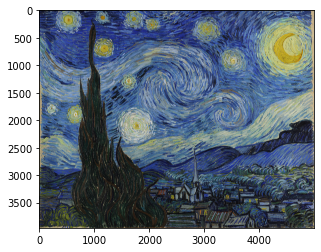

size of the output layer =  (3959, 5000, 3)


In [3]:
import matplotlib.pyplot as plt
plt.imshow(img) 
plt.show() 
print ("size of the output layer = ", img.shape) #printing the size of the image

#Rescaling the image

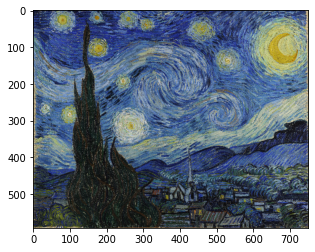

size of the output layer =  (593, 750, 3)


In [4]:
scale_percent = 15 #percent by which the image is resized

#calculate the percent of original dimensions
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)

# dsize
dsize = (width, height)

img = cv2.resize(img, dsize)

plt.imshow(img) 
plt.show() 
print ("size of the output layer = ", img.shape) #printing the size of the image

# building the model

##the first layer is a convolution layer
![alt text](https://hgzmfemymmoqayoywgseid.coursera-apps.org/notebooks/week1/images/Convolution_schematic.gif)

In [5]:
cnn = Sequential() #the model name is cnn and it is sequential layers
k = 3 #size of the filter 
cnn.add(Conv2D(filters= 16, #the number of filters applyied to the image
               kernel_size=(k,k), #the size of each filter
               input_shape = img.shape)) # the input shape is the same shape of the input image

##The second layer is an activatiion layer and the fourth layer is maxpooling layer 
![alt text](https://miro.medium.com/proxy/1*Feiexqhmvh9xMGVVJweXhg.gif)

In [6]:
cnn.add( Activation (activation = 'relu') )
cnn.add(MaxPool2D(pool_size=2, strides=2))

##The fifth layer is a convolution layer


In [7]:
cnn.add(Conv2D(filters= 32, #the number of filters applyied to the image
               kernel_size=(k,k))) #the size of each filter
           

##The sixth layer is an activation layer and the eigth layer is a maxpooling layer

In [8]:
cnn.add( Activation (activation = 'relu') )
cnn.add(MaxPool2D(pool_size=2, strides=2))

##adding a flatten layer and 2 dense layers
the faltten layer is a layer to convert the 3D array to 1D array "converting the convolution layer to a normal layer"

In [9]:
cnn.add(Flatten())
cnn.add(Dense(units=32, activation='relu'))
cnn.add(Dense(units=1, activation='softmax'))

##plotting a summary of the built model

In [10]:
cnn.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 591, 748, 16)      448       
_________________________________________________________________
activation (Activation)      (None, 591, 748, 16)      0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 295, 374, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 293, 372, 32)      4640      
_________________________________________________________________
activation_1 (Activation)    (None, 293, 372, 32)      0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 146, 186, 32)      0         
_________________________________________________________________
flatten (Flatten)            (None, 868992)            0

#converting the shape of the image from 3D to 4D
the only reason for doing that is because the visualizing function has the input a 4D array 

In [11]:
img = img[None,:,:,:]
print ("size of the output layer = ", img.shape)

size of the output layer =  (1, 593, 750, 3)


#building a function for visualizing the output of each layer

In [12]:
!pip3 install keract

In [16]:
import numpy as np
from keract import get_activations, display_activations

def the_output_of_each_layer(img) :
  color = "gist_rainbow" #gist_ncar or hsv or gist_rainbow
  activations = get_activations(cnn, img,  auto_compile=True)
  display_activations(activations, cmap = color, save = False)
  print ("size of the output layer = ", img.shape)

#Visualize the output of each layer


conv2d_input (1, 593, 750, 3) 


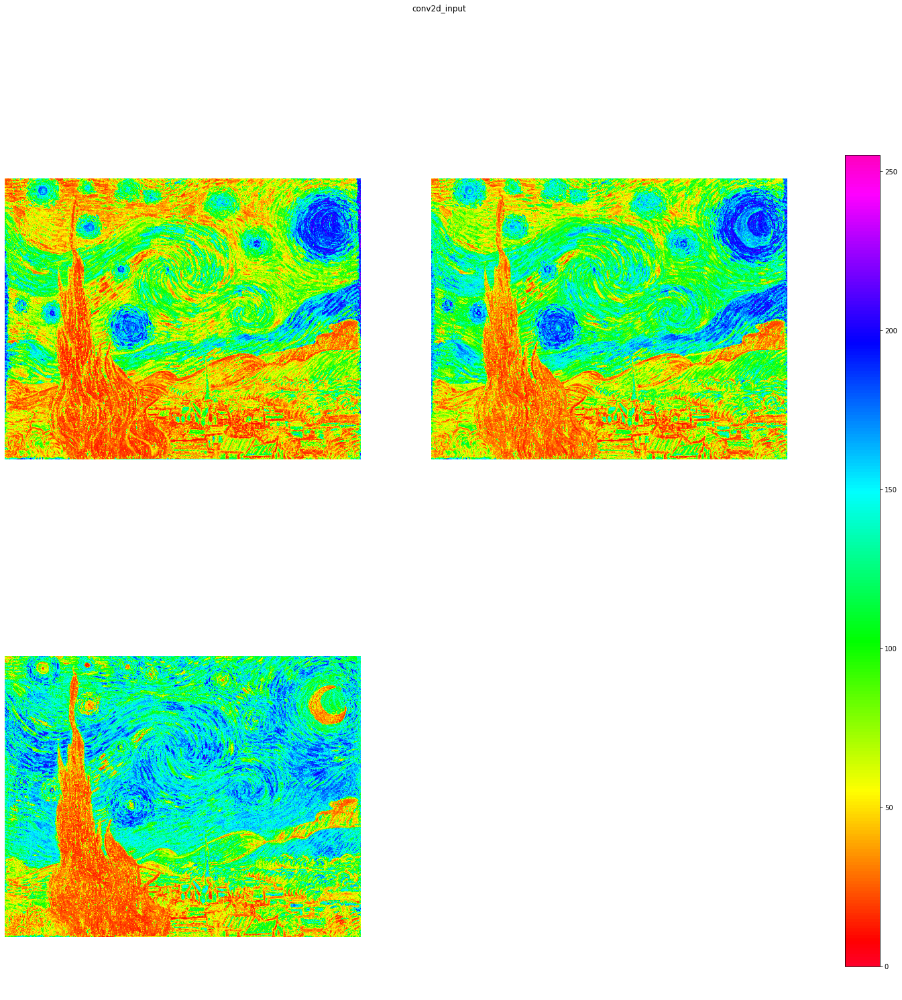

conv2d (1, 591, 748, 16) 


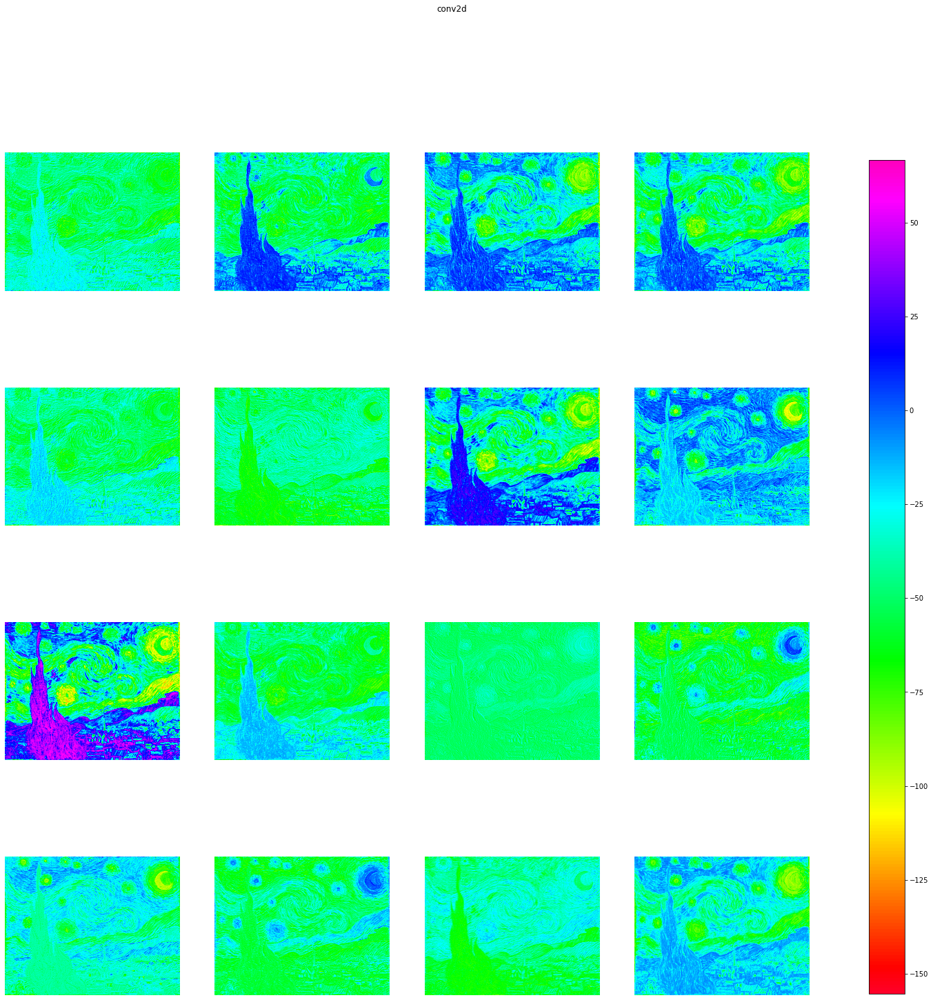

activation (1, 591, 748, 16) 


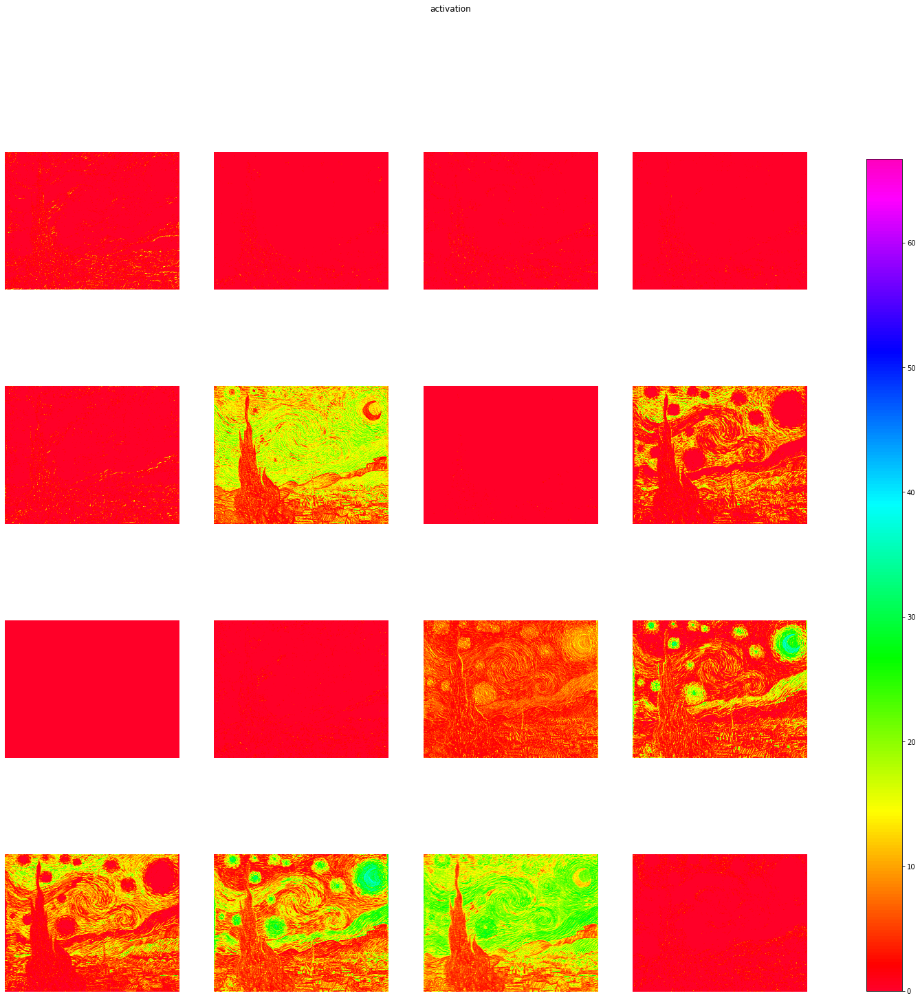

max_pooling2d (1, 295, 374, 16) 


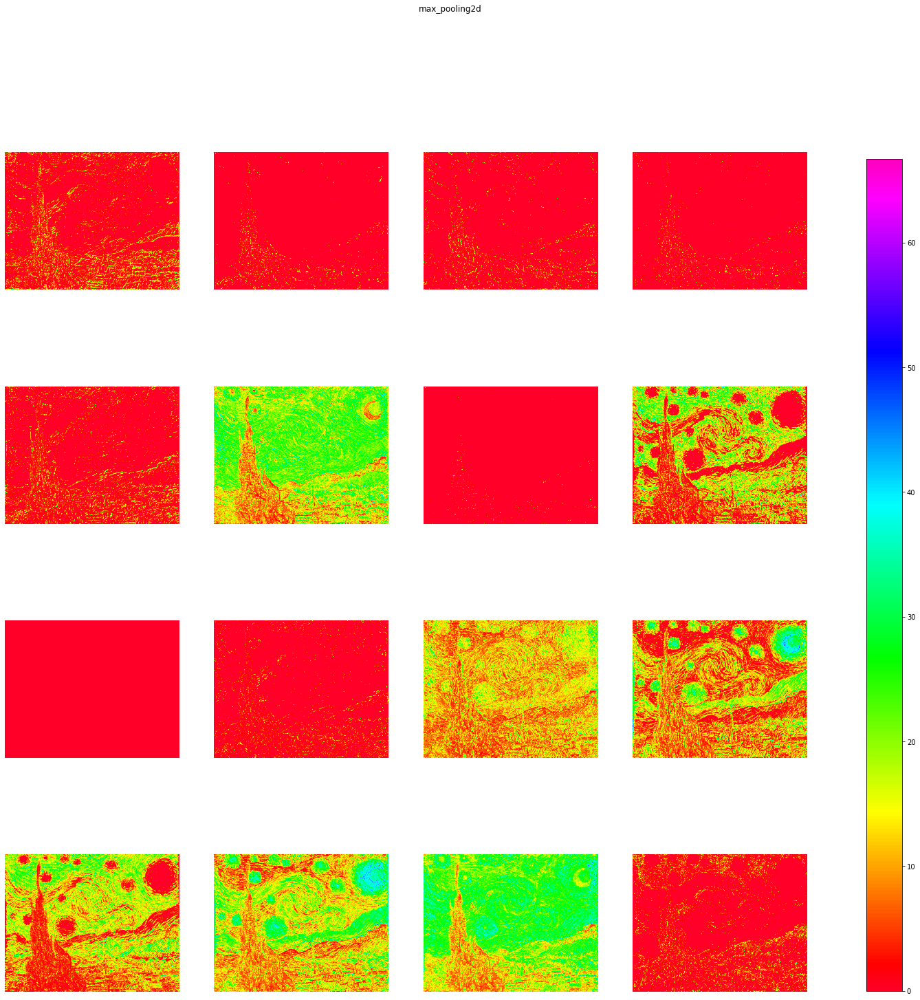

conv2d_1 (1, 293, 372, 32) 


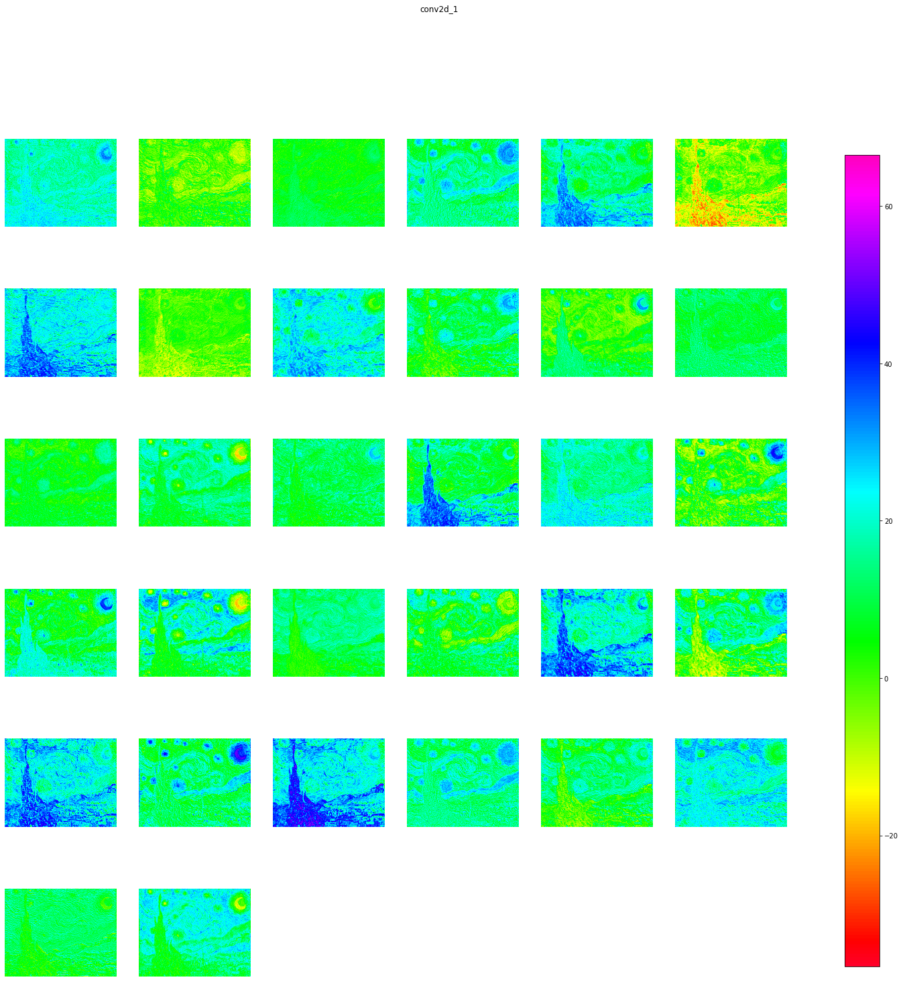

activation_1 (1, 293, 372, 32) 


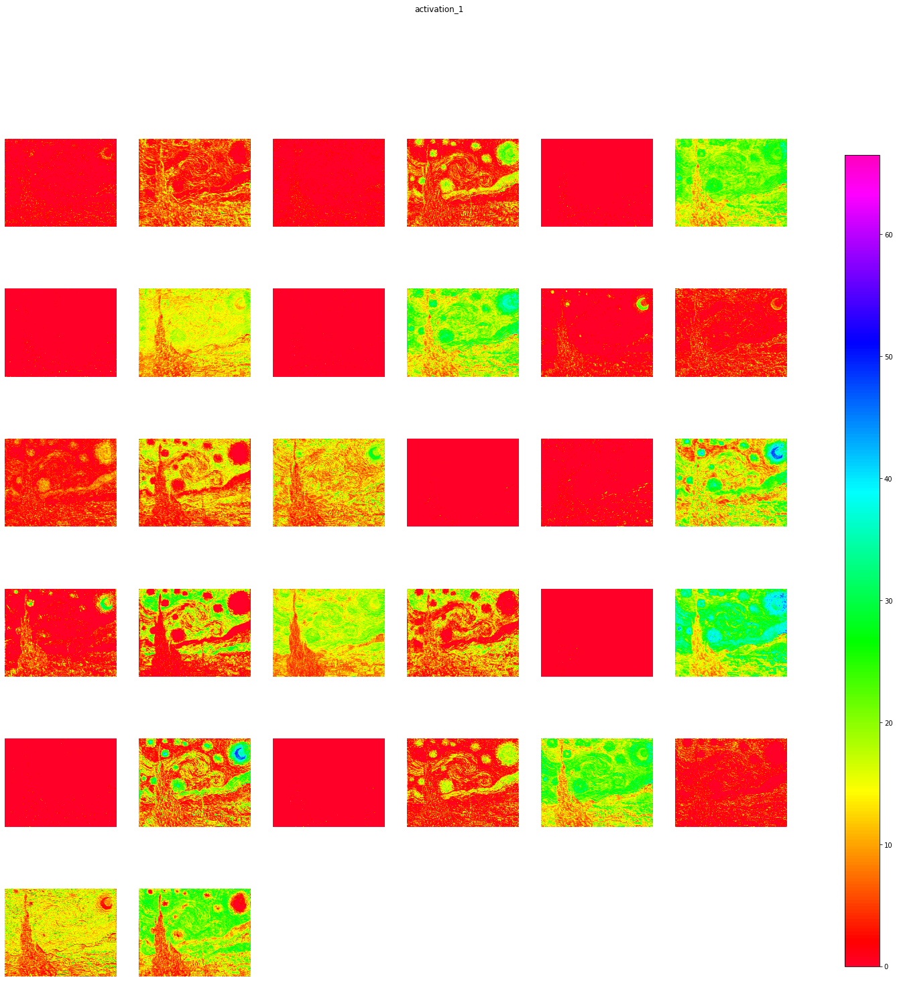

max_pooling2d_1 (1, 146, 186, 32) 


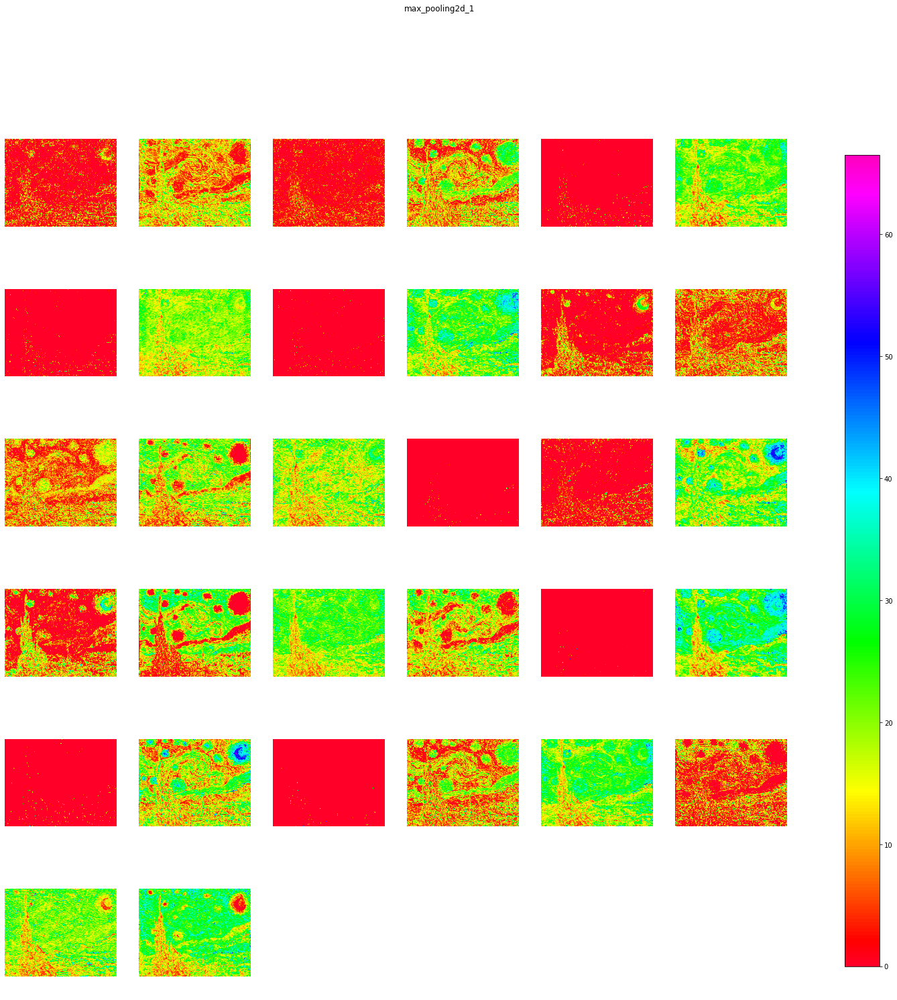

flatten (1, 868992) 


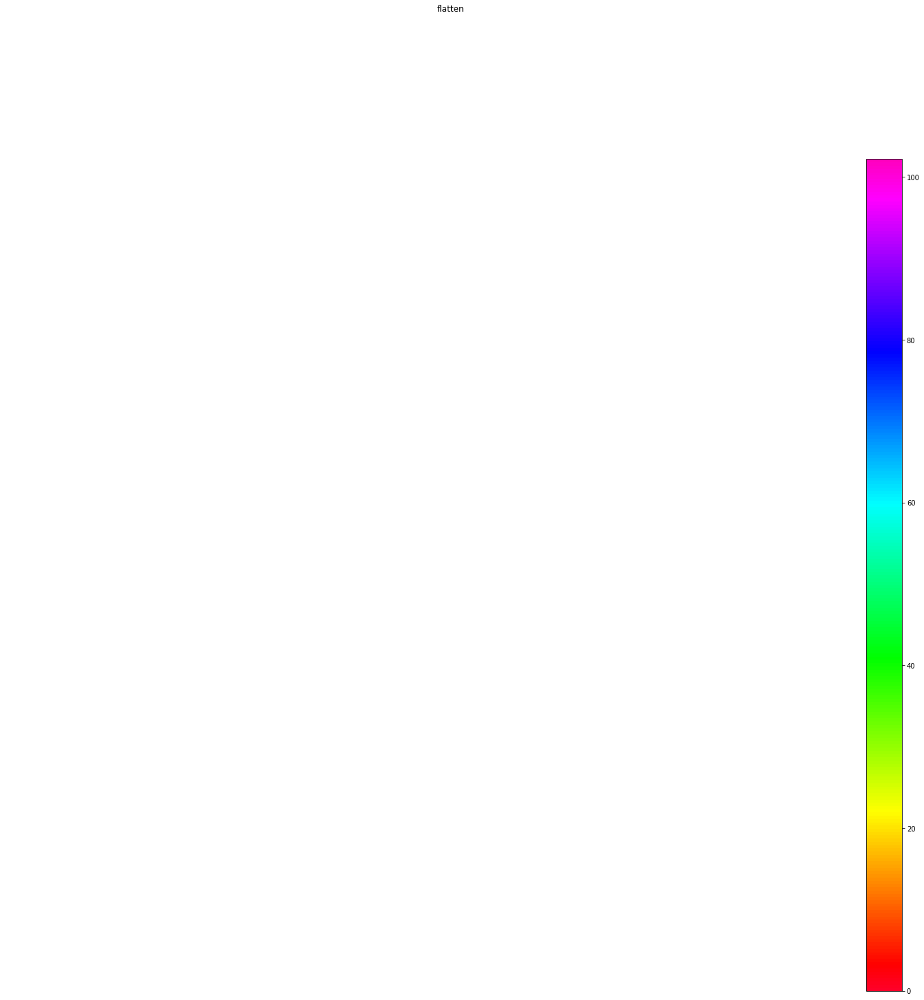

dense (1, 32) 


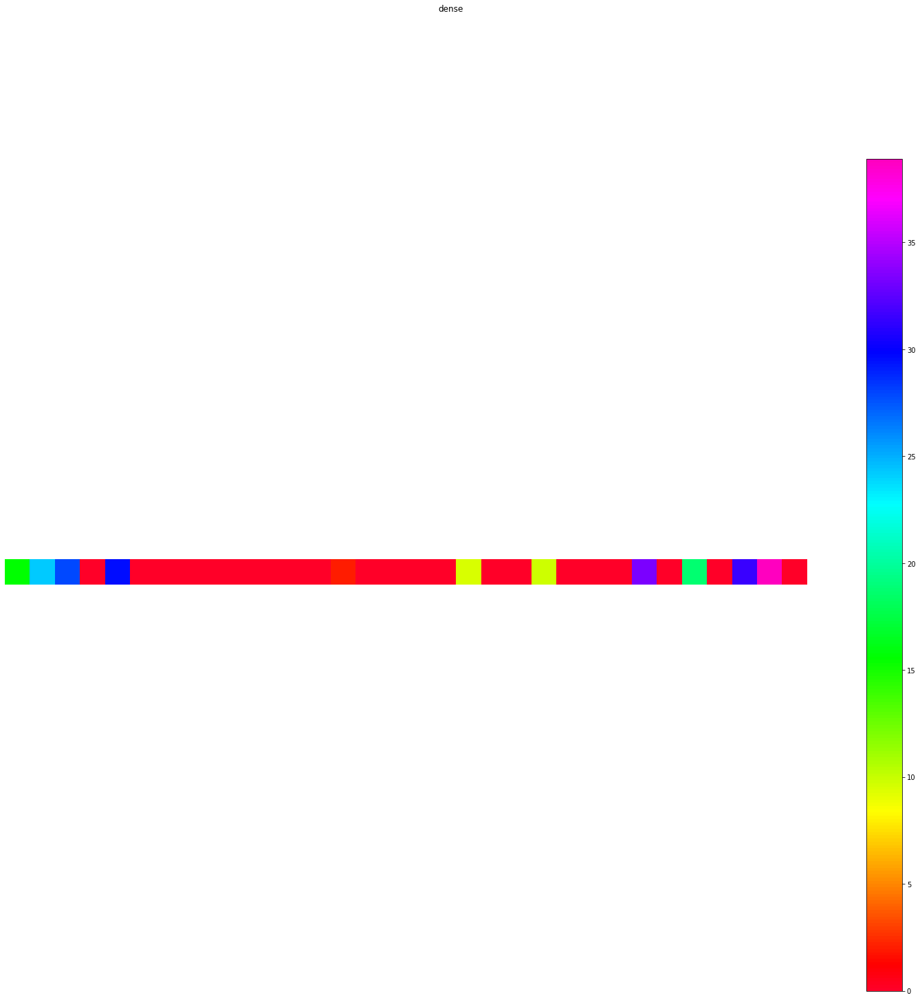

dense_1 (1, 1) 


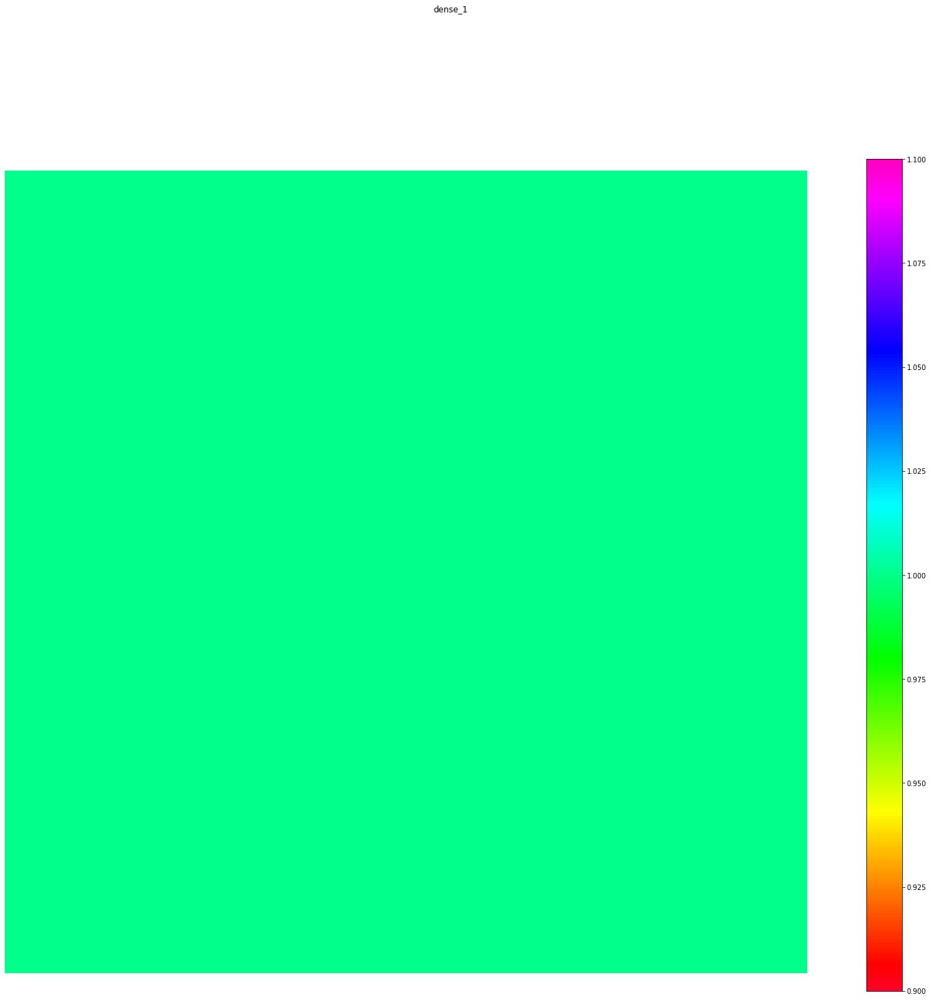

size of the output layer =  (1, 593, 750, 3)


In [17]:
the_output_of_each_layer(img)